# Coded By: Soumyanetra Pal & Rahul Raghav
AI22MTECH14005 & AI22MTECH13007

# Imports

In [ ]:
import os
from google.colab import drive
import pickle

import numpy as np
import matplotlib.pyplot as plt

import time

import torch
import torch.nn.init as init
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader


# Mount Drive

In [ ]:
#Mount Google Drive to G-colab
def mountDrive():

  drive.mount('/content/drive')
  %cd ./drive/MyDrive/IVP_project/code
  

  print(os.listdir())

mountDrive()

Mounted at /content/drive
/content/drive/MyDrive/IVP_project/code
['dataset.py', 'images', '__pycache__', '.ipynb_checkpoints', 'pretrained', 'Weights_DnCNN_S_SGD.pickle', 'Exsisting.ipynb', 'Weights_DnCNN_S_Adam.pickle', 'Weights_DnCNN_S_Adam_Gray.pickle', 'Weights_DnCNN_B.pickle', 'DnCNN_GPU.ipynb', 'ID_DnCNN_S.pth', 'Deep_DnCNN_GPU.ipynb', 'ID_DL_DnCNN_S.pth', 'Deep_Dialated_DnCNN_GPU.ipynb', 'Deep_Dialated_NM_DnCNN_GPU.ipynb', 'DnCNN_GPU_MTR-9.ipynb']


# Plot Images

In [ ]:
"""
This block is to setup a code that will take care of displaying the images
"""

def imshow(I, title="Image"):
    plt.title(title)
    plt.imshow(I, cmap='gray')

def showImages(*Images,titles=[], figsize=(15,15)):
    I_count = len(Images)

    plt.subplots(1,I_count, figsize=figsize)

    for pos, I in enumerate(Images):
        plt.subplot(1,I_count,pos+1)
        try:
            imshow(I,titles[pos])
        except:
            imshow(I)
    
    plt.show()

# Device Setter

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

device = get_default_device()

# Save and Read Weights

In [ ]:
def saveWeights(obj, model):
    try:
        with open(f'Weights_{model}.pickle', "wb") as f:
            pickle.dump(obj, f, protocol=pickle.HIGHEST_PROTOCOL)
            print(f"Saved Parameters as Weights_{model}.pickle")
    except Exception as ex:
        print("Error during pickling object (Possibly unsupported):", ex)

def loadWeights(model):
    try:
        with open(f"Weights_{model}.pickle", "rb") as f:
            return pickle.load(f)
    except Exception as ex:
        print("Error during unpickling object (Possibly unsupported):", ex)
 


# Residual CNN 

In [ ]:
# Define the CNN architecture
class CNN(nn.Module):
    def __init__(self, D, kernelSize = 3, imgChannels=3, nChannels=64, batchSize = 128, randomState = 0):
        super(CNN, self).__init__()

        #Seed for Reproducibility
        torch.manual_seed(randomState)

        #Calculate Appropriate Padding according to Kernel Size
        pad = (kernelSize-1)//2

        self.batchSize = batchSize

        # Conv+ReLU: 64 filters (3x3xc), c: no. of image channels, padding: to maintain spatial dimensions
        self.conv1 = nn.Conv2d(in_channels=imgChannels, out_channels=nChannels, kernel_size=kernelSize, padding=pad)
        self.relu = nn.ReLU(inplace=True)

        # 2 ~ (D-1) layers: 64 filters (3x3x64) along with BN layers between convolution and ReLU
        self.convLayers = nn.ModuleList([nn.Sequential(
                                nn.Conv2d(in_channels=nChannels, out_channels=nChannels, kernel_size=kernelSize, padding=pad),
                                nn.BatchNorm2d(nChannels,eps=0.0001, momentum = 0.9),
                                nn.ReLU()
                            ) for _ in range(D-1)
                          ])
        # Last Layer: c filters(3x3x64) to recostruct the image
        self.output = nn.Conv2d(in_channels=nChannels, out_channels=imgChannels, kernel_size=kernelSize, padding=pad)

        self._initialize_weights()
        
    def forward(self, x):
        #Conv+Relu
        y = x.clone() #Noisy Images
        x = self.conv1(x)
        x = self.relu(x)
        # 2 ~ (D-1) layers
        for i,conv in enumerate(self.convLayers):
            x = conv(x)

        out = self.output(x) #  Learned Noise

        return y-out
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.orthogonal_(m.weight)
                # print('init weight')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)



# Dataset Creation

In [ ]:
"""
    Converts RGB Image to Grayscale
"""
def grayscale(rgb):
    if(len(rgb.shape) == 3):
        return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    else:
        return rgb

In [ ]:
# from dataset import create_train_dataset
import random, glob, io

import cv2, PIL

import numpy as np
import matplotlib.pyplot as plt

def create_train_dataset(data_path, model_type, noise_level=[25], stride=30, createPatches=True, isGrayscale=False):
    # define dataset
    if(createPatches):
      if model_type == "DnCNN-S":
        patchShape = (40, 40, 3)
      elif model_type in ["DnCNN-B", "DnCNN-3"]:
        patchShape = (50, 50, 3)
      else:
          print("wrong type")
          exit()
    else:
      patchShape = None
    

    if(isGrayscale and patchShape):
      patchShape = patchShape[:2]
    dataset= DnCNN_train_Dataset(data_path, model_type, patch_shape=patchShape, noise_level=noise_level, createPatches=createPatches, isGrayscale=isGrayscale)    

    data = dataset.getPatches(stride)
    
    return data


class DnCNN_train_Dataset():
    def __init__(self, dataset_path, model_type, noise_level=[25],\
                 image_shape=(180, 180), patch_shape=(50, 50), createPatches=True, isGrayscale=False):
        #DnCNN-S/B uses 200 training and 200 test images in BDS500 as training set
        #DnCNN-3 uses 200 training images in BDS500 and T91 images as training set
        if(isGrayscale):
          self.im_list = [grayscale(plt.imread(file)) for file in glob.glob(f'{dataset_path}*.jpg')]
        else:
          self.im_list = [plt.imread(file) for file in glob.glob(f'{dataset_path}*.jpg')]
        self.noise_level = noise_level
        self.patch_shape = patch_shape
        self.image_shape = image_shape
        self.model_type = model_type
        self.scales = [0.8, 1, 1.25]
        self.sr_scales = [2, 3, 4]
        self.compression_range = (5, 100)
        self.sigma_range = (0, 55)
        self.createPatches = createPatches
        self.isGrayscale = isGrayscale

    def getPatches(self, stride):
        patches = []
        # if self.model_type == "DnCNN-S":
        #   n_patch = 4
        # elif self.model_type in ["DnCNN-B", "DnCNN-3"]:
        #   n_patch = 8
        # else:
        #   print("wrong type")
        #   exit()
        for img in self.im_list:
            #random scale
            # scale = random.choice(self.scales)
            # img_h = int(self.image_shape[1]*scale)
            # img_w = int(self.image_shape[0]*scale)
            img_h, img_w = (180,180)
            img = cv2.resize(img, (img_h, img_w))
            
            sigma = random.choice(self.noise_level)

            """
            take overlapping samples
            """
            #crop random patch
            # start_w = random.randint(0, img_w - self.patch_shape[0])
            # start_h = random.randint(0, img_h - self.patch_shape[1])
            if(self.createPatches):
              pass
            else:
              stride = max(img_h, img_w)
            for i in range(0,img_h, stride):
              for j in range(0,img_w, stride):
                if(self.createPatches):
                  if(self.isGrayscale):
                    patch = img[i:i+self.patch_shape[0], j:j+self.patch_shape[1]]
                  else:
                    patch = img[i:i+self.patch_shape[0], j:j+self.patch_shape[1],:]
                else:
                  patch = img
                # print(self.patch_shape)
                if(not self.createPatches or (patch.shape[:2] == (self.patch_shape[:2]))):

                  #random flip & rotation
                  # patch = self.data_augment(patch)

                  #add noise
                  if self.model_type == "DnCNN-S":
                      #add specific level of noise
                      noisy = self.add_noise(patch, sigma) 
                  elif self.model_type == "DnCNN-B":
                      #add random level of noise
                      sigma = random.uniform(*self.sigma_range)
                      noisy = self.add_noise(patch, sigma)
                  elif self.model_type == "DnCNN-3":
                      #randomly add noise, down-up sampling blur and jpeg bloc
                      noisy = self.add_random_type_noise(patch)
                  else:
                      print("wrong type")
                      exit()
                  noise = np.float32(noisy) - np.float32(patch)

                  #normalize
                  noisy = noisy / 255.0
                  noise = noise / 255.0

                  if(self.isGrayscale):
                    noisy = torch.tensor(noisy, dtype=torch.float).unsqueeze(0)
                    noise = torch.tensor(noise).unsqueeze(0)
                  else:
                    noisy = torch.tensor(noisy.transpose(2,0,1), dtype=torch.float)
                    noise = torch.tensor(noise.transpose(2,0,1))

                  # print('-< ',noisy.device)

                  patches.append((noisy, noise))

        print(f'\nDataset Shape: {np.array(patches).shape}\n')
        return patches

    def data_augment(self, patch):
        #random flip & rotation
        if random.random() < 0.5:
            patch = np.fliplr(patch)
        if random.random() < 0.5:
            patch = np.flipud(patch)
        alea = random.random()
        if alea > 0.25:
            patch = np.rot90(patch)
        elif alea > 0.5:
            patch = np.rot90(patch, k=2)
        elif alea > 0.75:
            patch = np.rot90(patch, k=3)
        return patch

    def add_random_type_noise(self, patch):
        #random noise/down-up resampling/JPEG compression
        alea = random.random()
        if alea < 0.33: #generate noisy image
            sigma = random.uniform(*self.sigma_range)
            noisy = self.add_noise(patch, sigma)
        elif alea < 0.66: #generate blur image
            sr_scale = random.choice(self.sr_scales)
            noisy = cv2.resize(patch, (int(self.patch_shape[0]/sr_scale), int(self.patch_shape[1]/sr_scale)))
            noisy = cv2.resize(noisy, (int(self.patch_shape[0]), int(self.patch_shape[1])))
        else: #generate JPEG blocking image
            compression_level = random.randint(*self.compression_range)
            noisy = self.jpeg_compression(patch, compression_level)
        return noisy

    def add_noise(self, im, sigma):
        gauss = np.random.normal(0, sigma, im.shape)
        noisy = im+gauss
        # i = im.transpose(2,0,1)
        # noisy = np.array([ic + gauss for ic in i])
        # noisy = noisy.transpose(1,2,0)
        noisy = np.clip(noisy, 0, 255)
        noisy = noisy.astype('uint8')
        return noisy

    def jpeg_compression(self, img, quality):
        im_pil = PIL.Image.fromarray(img)
        output = io.BytesIO()
        im_pil.save(output, 'JPEG', quality=quality)
        im_pil = PIL.Image.open(output)
        img_np = np.asarray(im_pil)
        return img_np


# Cuda Checker

In [ ]:
def check_cuda(model):
    for name, param in model.named_parameters():
        if param.is_cuda:
            print(f"{name} is on CUDA")
        else:
            print(f"{name} is not on CUDA")


# Train DnCNN-S 
function definition

In [ ]:
def plot(loss_hist):
  plt.plot(np.arange(0,len(loss_hist),1), loss_hist)
  plt.title('Training Loss vs Epochs')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')

In [ ]:
def trainModel(batches, D, ks, epochs, lr, m, wd, grad_clip, opt_algo, isGrayscale=False):
  torch.cuda.empty_cache()
  #Instantiate the model
  if(isGrayscale):
    RES_CNN = CNN(D,kernelSize=ks, imgChannels=1)
  else:
    RES_CNN = CNN(D,kernelSize=ks)

  #Set it to GPU
  RES_CNN_gpu = to_device(RES_CNN, device)

  #To Check Model device type of parameters
  # check_cuda(RES_CNN_gpu)
  
  mse = nn.MSELoss()
  # mae = nn.L1Loss()

  # ssim = SSIMLoss().cuda()
  # ssim_loss = pytorch_ssim.SSIM()


  # Define the loss function and optimizer
  if( opt_algo == 'SGD'):
    optimizer = optim.SGD(RES_CNN_gpu.parameters(), lr=lr, momentum=m, weight_decay=wd)
  else:
    optimizer = optim.Adam(RES_CNN_gpu.parameters(), lr=lr, weight_decay=wd)
  
  # scheduler = MultiStepLR(optimizer, milestones=[20, 40, 90], gamma=0.2)  # learning rates

  # Train the CNN
  loss_hist = []
  for epoch in range(epochs):
      # RES_CNN_gpu.train()
      # scheduler.step(epoch)  # step to the learning rate in this epcoh
      running_loss = 0.0
      for batch in batches:
          inputs, labels = batch
          optimizer.zero_grad()
          outputs = RES_CNN_gpu(inputs) #denoised Image

          #MSE Loss
          # loss = mse(outputs, inputs - labels)

          #Using Frobenious Norm Loss
          loss = torch.norm(inputs-labels-outputs)/(2*128)

          loss.backward()

          nn.utils.clip_grad_value_(RES_CNN_gpu.parameters(), grad_clip)
          optimizer.step()
          running_loss += loss.item()
      # scheduler.step(epoch)  # step to the learning rate in this epcoh
      running_loss = running_loss /len(batches)
      print(f'Epoch: {epoch + 1}, Loss: {running_loss:.5f}, {((epoch+1)/epochs*100):0.2f}% completed')
      loss_hist.append(running_loss)
      running_loss = 0.0

  print('Training Complete... I have learned Enough!!\n')

  plot(loss_hist)

  return RES_CNN_gpu

# Test DnCNN-S
function definition

In [ ]:
def test(batches, model):
  # switch to evaluation mode
  model.eval()

  with torch.no_grad():
      for batch in batches:
          inputs, labels = batch
          outputs = model(inputs)
  return inputs, labels, outputs

# Hyper Parameters

In [ ]:
#Hyper-parameters
def getHyperParams():
  D = 17          # Depth of Network
  EPOCHS = 50
  LR = 0.0001     # Learning Rate
  M = 0.9         # Momentum
  BS = 128        # Batch Size
  WD = 1E-3       # Weight Decay

  KERNEL_S = 5
  GRAD_CLIP = 0.1 #Clip Gradients

  Noise_L = [25]    # Noise Level

  return D, EPOCHS, KERNEL_S, LR, M, BS, WD, GRAD_CLIP, Noise_L

# Data Batches

In [ ]:
def getDataBatches(path, model_name, bacthSize, noiseLevel, isGrayscale=False, stride=30):
  dataset = create_train_dataset(path, model_name, noise_level = noiseLevel, stride=stride, isGrayscale=isGrayscale)
  batches = DataLoader(dataset, batch_size=bacthSize, shuffle=True, num_workers=2, pin_memory=True)
  batches_gpu = DeviceDataLoader(batches, device)
  return batches_gpu

# Train DnCNN-S Model with SGD Optimizer


Dataset Shape: (10000, 2)



<ipython-input-21-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-21-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')


Epoch: 1, Loss: 1.29729, 2.00% completed
Epoch: 2, Loss: 0.46089, 4.00% completed
Epoch: 3, Loss: 0.35149, 6.00% completed
Epoch: 4, Loss: 0.32518, 8.00% completed
Epoch: 5, Loss: 0.31442, 10.00% completed
Epoch: 6, Loss: 0.30749, 12.00% completed
Epoch: 7, Loss: 0.30345, 14.00% completed
Epoch: 8, Loss: 0.30140, 16.00% completed
Epoch: 9, Loss: 0.29967, 18.00% completed
Epoch: 10, Loss: 0.29790, 20.00% completed
Epoch: 11, Loss: 0.29707, 22.00% completed
Epoch: 12, Loss: 0.29578, 24.00% completed
Epoch: 13, Loss: 0.29482, 26.00% completed
Epoch: 14, Loss: 0.29429, 28.00% completed
Epoch: 15, Loss: 0.29371, 30.00% completed
Epoch: 16, Loss: 0.29350, 32.00% completed
Epoch: 17, Loss: 0.29301, 34.00% completed
Epoch: 18, Loss: 0.29274, 36.00% completed
Epoch: 19, Loss: 0.29226, 38.00% completed
Epoch: 20, Loss: 0.29186, 40.00% completed
Epoch: 21, Loss: 0.29146, 42.00% completed
Epoch: 22, Loss: 0.29139, 44.00% completed
Epoch: 23, Loss: 0.29118, 46.00% completed
Epoch: 24, Loss: 0.29101

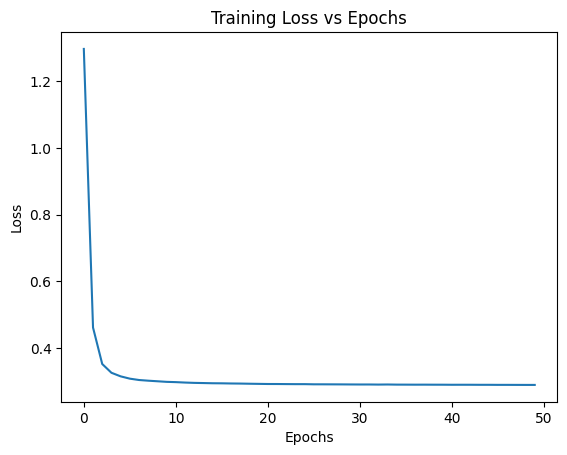

In [ ]:
D, EPOCHS, KERNEL_S, LR, M, BS, WD, GRAD_CLIP, Noise_L = getHyperParams()

# Load the data and create data loaders
train_dataset_path = "./images/train/"
train_batches_gpu = getDataBatches(train_dataset_path, 'DnCNN-S', BS, Noise_L)



start_time = time.time()

DnCNN_S_SGD = trainModel(train_batches_gpu, D, KERNEL_S, EPOCHS, LR, M, WD,GRAD_CLIP, 'SGD')

end_time = time.time()
run_time = round(end_time - start_time)
min = run_time//60
print(f'\nDuration in (min:sec): {min}:{(run_time-min*60)%60}\n')

saveWeights(DnCNN_S_SGD, 'DnCNN_S_SGD')

del DnCNN_S_SGD, train_batches_gpu


# Train DnCNN-S Model with Adam Optimizer


Dataset Shape: (10000, 2)



<ipython-input-21-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-21-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')


Epoch: 1, Loss: 0.48062, 2.00% completed
Epoch: 2, Loss: 0.29023, 4.00% completed
Epoch: 3, Loss: 0.28833, 6.00% completed
Epoch: 4, Loss: 0.28742, 8.00% completed
Epoch: 5, Loss: 0.28589, 10.00% completed
Epoch: 6, Loss: 0.27916, 12.00% completed
Epoch: 7, Loss: 0.26292, 14.00% completed
Epoch: 8, Loss: 0.23622, 16.00% completed
Epoch: 9, Loss: 0.21120, 18.00% completed
Epoch: 10, Loss: 0.19815, 20.00% completed
Epoch: 11, Loss: 0.19038, 22.00% completed
Epoch: 12, Loss: 0.18383, 24.00% completed
Epoch: 13, Loss: 0.17648, 26.00% completed
Epoch: 14, Loss: 0.16975, 28.00% completed
Epoch: 15, Loss: 0.16812, 30.00% completed
Epoch: 16, Loss: 0.16573, 32.00% completed
Epoch: 17, Loss: 0.16088, 34.00% completed
Epoch: 18, Loss: 0.15761, 36.00% completed
Epoch: 19, Loss: 0.15752, 38.00% completed
Epoch: 20, Loss: 0.15379, 40.00% completed
Epoch: 21, Loss: 0.15200, 42.00% completed
Epoch: 22, Loss: 0.15101, 44.00% completed
Epoch: 23, Loss: 0.15214, 46.00% completed
Epoch: 24, Loss: 0.14707

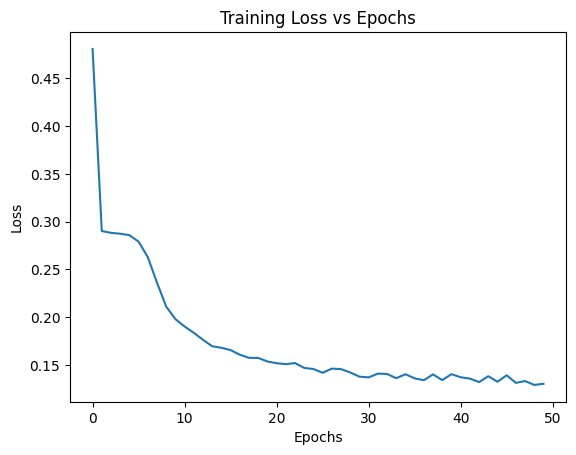

In [ ]:
D, EPOCHS, KERNEL_S, LR, M, BS, WD, GRAD_CLIP, Noise_L = getHyperParams()

# Load the data and create data loaders
train_dataset_path = "./images/train/"
train_batches_gpu = getDataBatches(train_dataset_path, 'DnCNN-S', BS, Noise_L)

start_time = time.time()

DnCNN_S_Adam = trainModel(train_batches_gpu, D, KERNEL_S, EPOCHS, LR, M, WD, GRAD_CLIP, 'Adam')

end_time = time.time()
run_time = round(end_time - start_time)
min = run_time//60
print(f'\nTraining Time in (min:sec): {min}:{(run_time-min*60)%60}\n')

#Save Weights
saveWeights(DnCNN_S_Adam, 'DnCNN_S_Adam')

del DnCNN_S_Adam, train_batches_gpu

# Test Utility Functions

In [ ]:
def PSNR(original, compressed):
    original = original.detach().numpy()
    compressed = compressed.detach().numpy()
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = original.max()
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

In [ ]:
def getTotalLoss(lables, outputs):
  mse = nn.MSELoss()
  loss = torch.sum((mse(outputs, lables)))
  return loss.item()


In [ ]:
def getOutput(inputs, labels, outputs):
  inputs = inputs.cpu()
  labels = labels.cpu()
  outputs = outputs.cpu()
  inp_subset = inputs[:5].permute((0,2,3,1))  #Noisy
  tru_n_subset = labels[:5].permute((0,2,3,1)) #Noise
  tru_img_subset = inp_subset-tru_n_subset #true image
  op_subset = outputs[:5].permute((0,2,3,1)) #predicted clean image

  for i in range(5):
    psnr  = PSNR(tru_img_subset[i], op_subset[i])
    titles = ['Input Image','True Noise', 'Learned Noise', 'Clean Image', f'Denoised Image\nPSNR: {psnr}']
    showImages(inp_subset[i],tru_n_subset[i], inp_subset[i]-op_subset[i], tru_img_subset[i], op_subset[i], titles=titles, figsize=(20,20))

# Test DnCNN-S Model with SGD Optimizer

<ipython-input-21-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-21-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')



Dataset Shape: (100, 2)

Total Test Loss: 0.23867861926555634


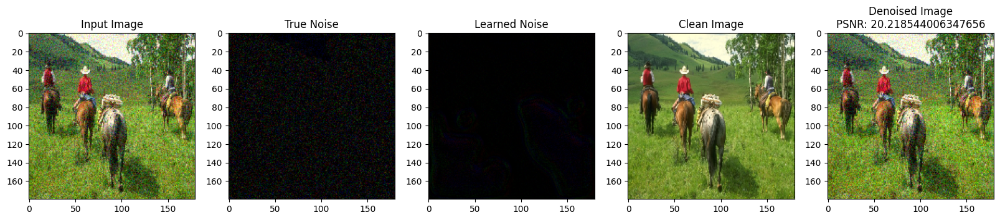

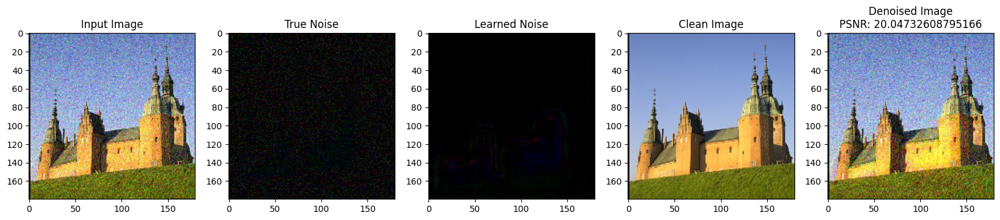

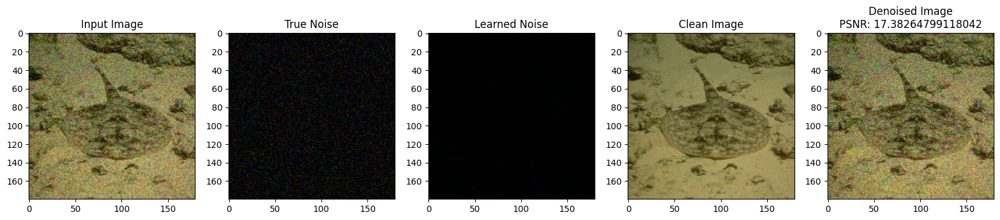

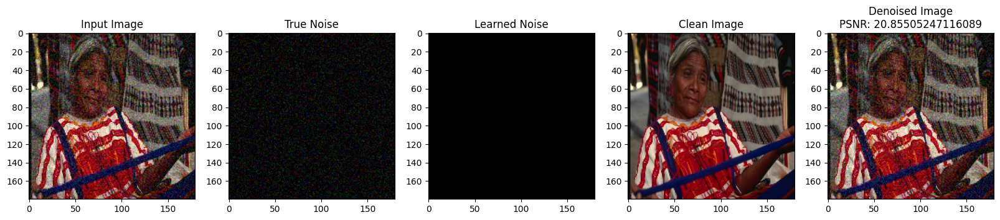

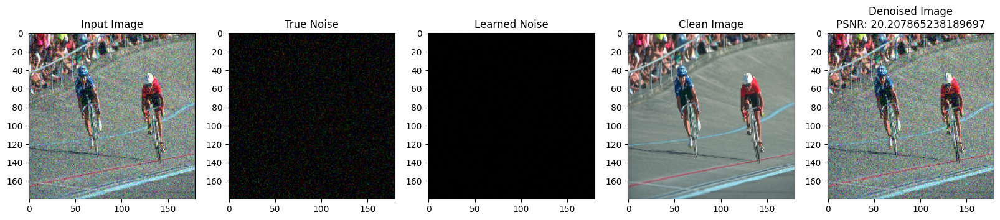

In [ ]:
DnCNN_S_SGD = loadWeights('DnCNN_S_SGD')

*_, Noise_L = getHyperParams()

test_dataset_path = "./images/test/"
test_dataset = create_train_dataset(test_dataset_path, 'DnCNN-S', noise_level = Noise_L, createPatches=False)
test_batches = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)
test_batches_gpu = DeviceDataLoader(test_batches, device)


inputs, labels, outputs = test(test_batches_gpu, DnCNN_S_SGD)

print(f"Total Test Loss: {getTotalLoss(labels, outputs)}")

getOutput(inputs, labels, outputs)

del DnCNN_S_SGD, inputs, labels, outputs

# Test DnCNN-S Model with Adam Optimizer

<ipython-input-21-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-21-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')



Dataset Shape: (100, 2)



Total Test Loss: 0.24250158667564392


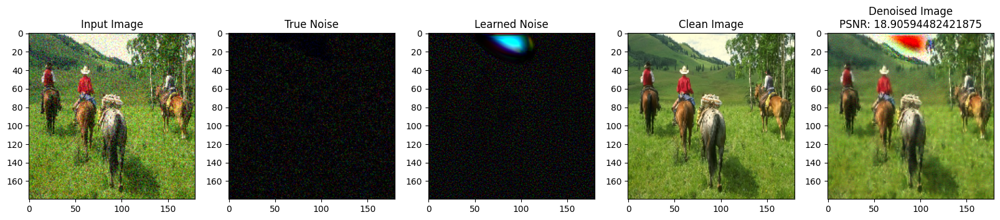

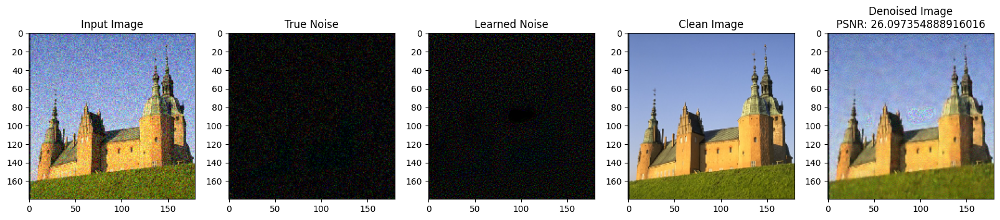

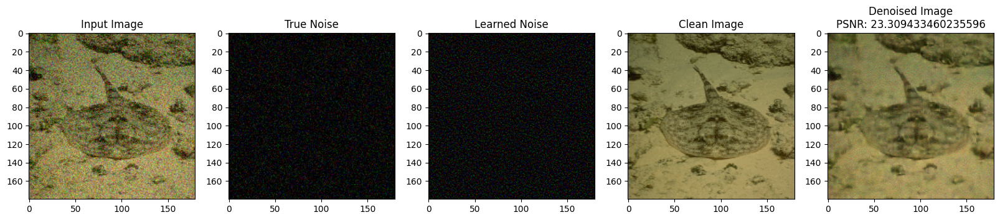

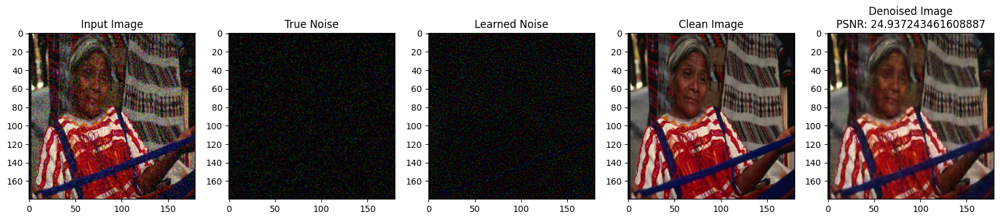

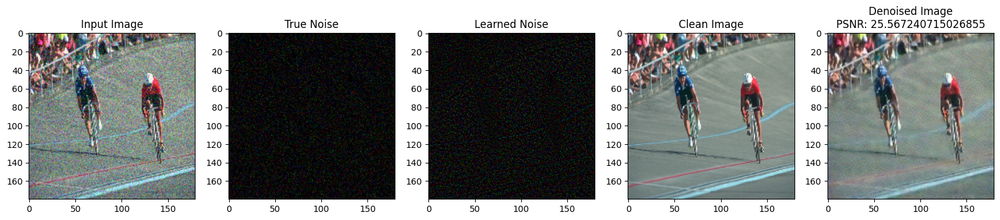

In [ ]:
DnCNN_S_Adam = loadWeights('DnCNN_S_Adam')

*_, Noise_L = getHyperParams()

test_dataset_path = "./images/test/"
test_dataset = create_train_dataset(test_dataset_path, 'DnCNN-S', noise_level = Noise_L, createPatches=False)
test_batches = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)
test_batches_gpu = DeviceDataLoader(test_batches, device)


inputs, labels, outputs = test(test_batches_gpu, DnCNN_S_Adam)

print(f"Total Test Loss: {getTotalLoss(labels, outputs)}")

getOutput(inputs, labels, outputs)
del DnCNN_S_Adam, inputs, labels, outputs

# Train Adam with Grayscale Images

<ipython-input-8-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-8-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')



Dataset Shape: (10000, 2)

Epoch: 1, Loss: 0.29601, 2.00% completed
Epoch: 2, Loss: 0.16234, 4.00% completed
Epoch: 3, Loss: 0.13464, 6.00% completed
Epoch: 4, Loss: 0.12060, 8.00% completed
Epoch: 5, Loss: 0.11399, 10.00% completed
Epoch: 6, Loss: 0.10862, 12.00% completed
Epoch: 7, Loss: 0.10510, 14.00% completed
Epoch: 8, Loss: 0.10289, 16.00% completed
Epoch: 9, Loss: 0.09988, 18.00% completed
Epoch: 10, Loss: 0.09644, 20.00% completed
Epoch: 11, Loss: 0.09646, 22.00% completed
Epoch: 12, Loss: 0.09430, 24.00% completed
Epoch: 13, Loss: 0.09325, 26.00% completed
Epoch: 14, Loss: 0.09205, 28.00% completed
Epoch: 15, Loss: 0.09153, 30.00% completed
Epoch: 16, Loss: 0.09255, 32.00% completed
Epoch: 17, Loss: 0.09157, 34.00% completed
Epoch: 18, Loss: 0.08919, 36.00% completed
Epoch: 19, Loss: 0.08999, 38.00% completed
Epoch: 20, Loss: 0.08978, 40.00% completed
Epoch: 21, Loss: 0.09047, 42.00% completed
Epoch: 22, Loss: 0.08904, 44.00% completed
Epoch: 23, Loss: 0.08934, 46.00% comple

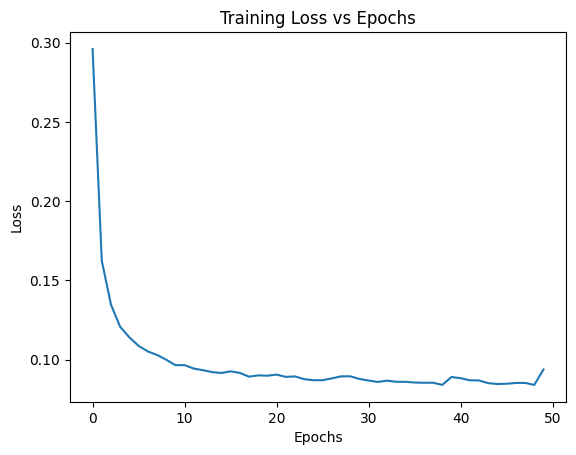

In [ ]:
D, EPOCHS, KERNEL_S, LR, M, BS, WD, GRAD_CLIP, Noise_L = getHyperParams()

# Load the data and create data loaders
train_dataset_path = "./images/train/"
train_batches_gpu = getDataBatches(train_dataset_path, 'DnCNN-S', BS, Noise_L, isGrayscale=True)

start_time = time.time()

DnCNN_S_Adam_gray = trainModel(train_batches_gpu, D, KERNEL_S, EPOCHS, LR, M, WD, GRAD_CLIP, 'Adam', isGrayscale=True)

end_time = time.time()
run_time = round(end_time - start_time)
min = run_time//60
print(f'\nTraining Time in (min:sec): {min}:{(run_time-min*60)%60}\n')

#Save Weights
saveWeights(DnCNN_S_Adam_gray, 'DnCNN_S_Adam_Gray')

del DnCNN_S_Adam_gray, train_batches_gpu

<ipython-input-8-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-8-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')



Dataset Shape: (100, 2)

Total Test Loss: 0.24072590470314026


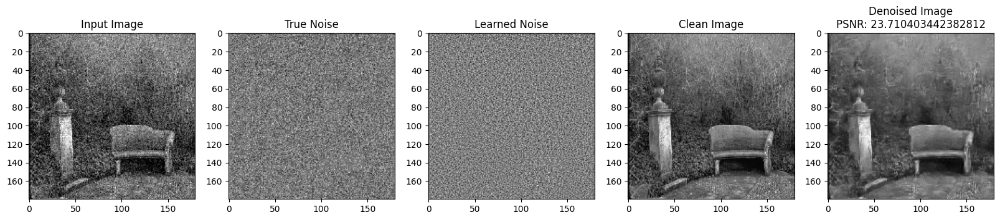

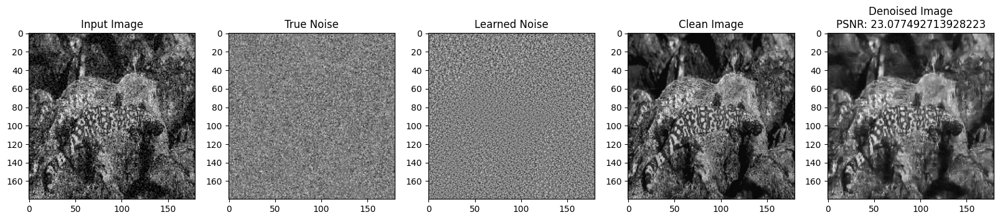

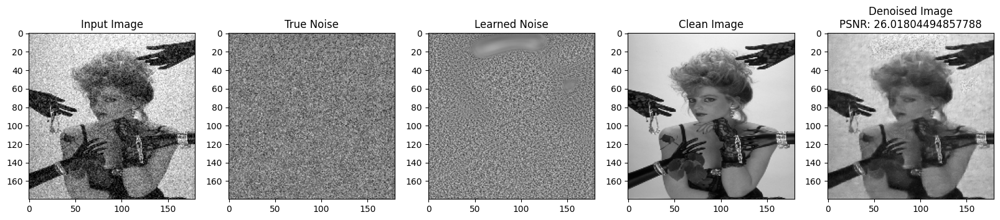

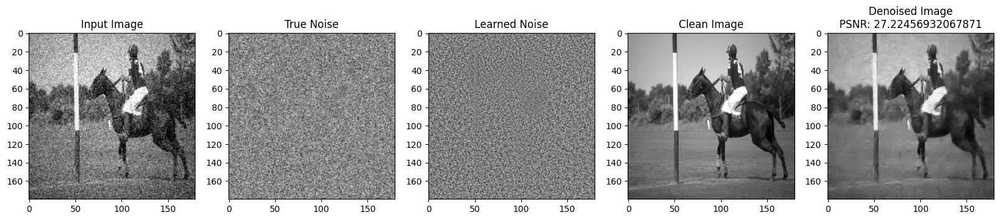

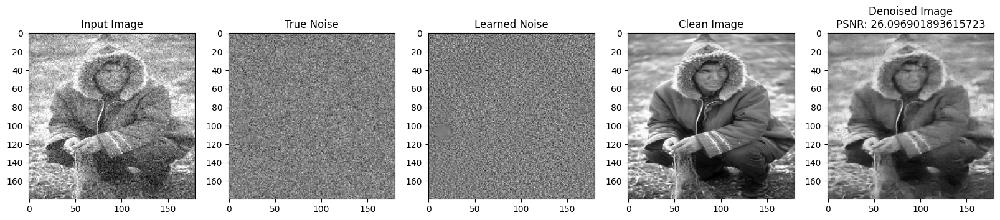

In [ ]:
DnCNN_S_Adam_gray = loadWeights('DnCNN_S_Adam_Gray')

*_, Noise_L = getHyperParams()

test_dataset_path = "./images/test/"
test_dataset = create_train_dataset(test_dataset_path, 'DnCNN-S', noise_level = Noise_L, createPatches=False, isGrayscale=True)
test_batches = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)
test_batches_gpu = DeviceDataLoader(test_batches, device)


inputs, labels, outputs = test(test_batches_gpu, DnCNN_S_Adam_gray)

print(f"Total Test Loss: {getTotalLoss(labels, outputs)}")

getOutput(inputs, labels, outputs)
del DnCNN_S_Adam_gray, inputs, labels, outputs

# DnCNN Blind

<ipython-input-8-070f9a4ea552>:127: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')
<ipython-input-8-070f9a4ea552>:127: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(f'\nDataset Shape: {np.array(patches).shape}\n')



Dataset Shape: (19600, 2)

Epoch: 1, Loss: 0.31355, 2.00% completed
Epoch: 2, Loss: 0.23616, 4.00% completed
Epoch: 3, Loss: 0.17818, 6.00% completed
Epoch: 4, Loss: 0.16056, 8.00% completed
Epoch: 5, Loss: 0.14994, 10.00% completed
Epoch: 6, Loss: 0.14354, 12.00% completed
Epoch: 7, Loss: 0.13763, 14.00% completed
Epoch: 8, Loss: 0.13388, 16.00% completed
Epoch: 9, Loss: 0.13121, 18.00% completed
Epoch: 10, Loss: 0.12932, 20.00% completed
Epoch: 11, Loss: 0.12744, 22.00% completed
Epoch: 12, Loss: 0.12593, 24.00% completed
Epoch: 13, Loss: 0.12517, 26.00% completed
Epoch: 14, Loss: 0.12423, 28.00% completed
Epoch: 15, Loss: 0.12266, 30.00% completed
Epoch: 16, Loss: 0.12312, 32.00% completed
Epoch: 17, Loss: 0.12136, 34.00% completed
Epoch: 18, Loss: 0.12137, 36.00% completed
Epoch: 19, Loss: 0.12085, 38.00% completed
Epoch: 20, Loss: 0.12071, 40.00% completed
Epoch: 21, Loss: 0.11971, 42.00% completed
Epoch: 22, Loss: 0.11876, 44.00% completed
Epoch: 23, Loss: 0.11779, 46.00% comple

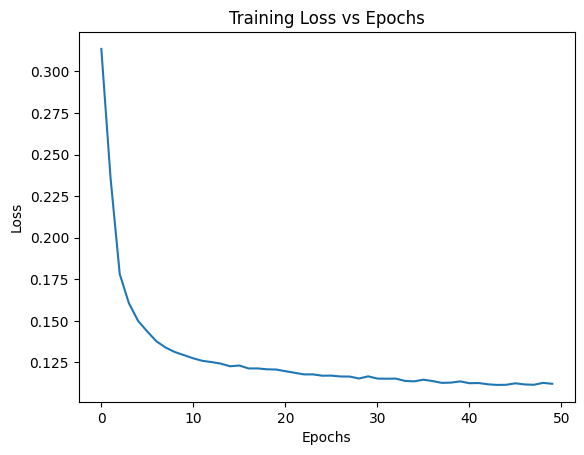

In [ ]:
D, EPOCHS, KERNEL_S, LR, M, BS, WD, GRAD_CLIP, Noise_L = getHyperParams()
D = 20

# Load the data and create data loaders
train_dataset_path = "./images/train/"
train_batches_gpu = getDataBatches(train_dataset_path, 'DnCNN-B', BS, Noise_L,isGrayscale=True, stride=20)

start_time = time.time()

DnCNN_S_Adam = trainModel(train_batches_gpu, D, KERNEL_S, EPOCHS, LR, M, WD, GRAD_CLIP, 'Adam',isGrayscale=True)

end_time = time.time()
run_time = round(end_time - start_time)
min = run_time//60
print(f'\nTraining Time in (min:sec): {min}:{(run_time-min*60)%60}\n')

#Save Weights
saveWeights(DnCNN_S_Adam, 'DnCNN_B')

del DnCNN_S_Adam, train_batches_gpu

In [ ]:
DnCNN_S_Adam_gray = loadWeights('DnCNN_B')

*_, Noise_L = getHyperParams()

test_dataset_path = "./images/test/"
test_dataset = create_train_dataset(test_dataset_path, 'DnCNN-B', noise_level = Noise_L, createPatches=False, isGrayscale=True)
test_batches = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)
test_batches_gpu = DeviceDataLoader(test_batches, device)


inputs, labels, outputs = test(test_batches_gpu, DnCNN_S_Adam_gray)

print(f"Total Test Loss: {getTotalLoss(labels, outputs)}")

getOutput(inputs, labels, outputs)
del DnCNN_S_Adam_gray, inputs, labels, outputs

Output hidden; open in https://colab.research.google.com to view.